##### Copyright 2019 The TensorFlow Authors.

## Setup

In [1]:
import os
import datetime

import IPython
import IPython.display
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import xarray as xr
import seaborn as sns
import tensorflow as tf

from jetstream_hugo.plots import *
from jetstream_hugo.clustering import *
from jetstream_hugo.data import *
from jetstream_hugo.definitions import *
from jetstream_hugo.jet_finding import *

mpl.rcParams["figure.figsize"] = (8, 6)
mpl.rcParams["axes.grid"] = False


2023-10-25 11:19:51.789649: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-10-25 11:19:51.829209: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-10-25 11:19:51.829266: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-10-25 11:19:51.829290: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-10-25 11:19:51.838170: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-10-25 11:19:51.838794: I tensorflow/core/platform/cpu_feature_guard.cc:182] This Tens

In [2]:
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        # Currently, memory growth needs to be the same across GPUs
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        logical_gpus = tf.config.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        # Memory growth must be set before GPUs have been initialized
        print(e)

In [3]:
exp_s = Experiment(
    "ERA5", "s", "6H", "all", "JJA", -60, 70, 25, 85, 250, None, None, None
)
da_s = exp_s.da
exp_s_low = Experiment(
    "ERA5", "s", "6H", "all", "JJA", -60, 70, 25, 85, 700, None, None, None
)
exp_T = Experiment(
    "ERA5", "t", "6H", "all", "JJA", -60, 70, 25, 85, 250, 'dayofyear', None, {'detrended': True}
)
da_T = exp_T.da

def half(x: int):
    if x % 2 == 0:
        return x // 2, x // 2
    return x // 2 + 1, x // 2


def rescale(X: NDArray | xr.DataArray):
    X = (X - X.min()) / (X.max() - X.min())
    try:
        return X[:, :, :, None]
    except IndexError:
        return X.expand_dims(dim='channel', axis=-1)

def preprocess(
    X: NDArray | xr.DataArray,
    strides: list, 
    strategy: Literal["crop"] | Literal["pad"] | list | tuple = "crop",
) -> NDArray | xr.DataArray:
    if isinstance(strategy, str):
        strategy = (strategy, strategy)
    divisors = [1, 1]
    try:
        dims = list(X.dims)[1:]
    except AttributeError:
        dims = []
    for strides_ in strides:
        if isinstance(strides_, tuple):
            for i in range(2):
                divisors[i] *= strides_[i]
        else:
            for i in range(2):
                divisors[i] *= strides_
    for i, n in enumerate(X.shape[1:3]):
        factor = n / divisors[i]
        if strategy[i] == "crop":
            newn = int(np.floor(factor) * divisors[i])
            x1, x2 = half(n - newn)
            idxs = np.arange(x1, x1 + newn)
            if isinstance(X, NDArray):
                X = np.take(X, idxs, axis=i + 1)
            elif isinstance(X, xr.DataArray):
                X = X.isel({dims[i]: idxs})
        elif strategy[i] == "pad":
            newn = int(np.ceil(factor) * divisors[i])
            x1, x2 = half(newn - n)
            if isinstance(X, NDArray):
                padding = np.zeros((X.ndim, 2), dtype=int)
                padding[i + 1] = [x1, x2]
                X = np.pad(X, padding, mode='edge')
            elif isinstance(X, xr.DataArray):
                X = X.pad({dims[i]: (x1, x2)}, mode='edge')
    return X

da_s_cropped = preprocess(rescale(da_s.chunk('auto')), [2] * 5, ['pad', 'crop']).compute(n_workers=8, memory_limit='1GB')
da_T_cropped = preprocess(rescale(da_T.chunk('auto')), [2] * 5, ['pad', 'crop']).compute(n_workers=8, memory_limit='1GB')

smin, smax = da_s.min().values, da_s.max().values
Tmin, Tmax = da_T.min().values, da_T.max().values
date_time = da_s.time.to_pandas()


### Split the data

You'll use a `(70%, 20%, 10%)` split for the training, validation, and test sets. Note the data is **not** being randomly shuffled before splitting. This is for two reasons:

1. It ensures that chopping the data into windows of consecutive samples is still possible.
2. It ensures that the validation/test results are more realistic, being evaluated on the data collected after the model was trained.

In [4]:
n = len(YEARSPL_EXT)
y0 = YEARSPL_EXT[int(0.75 * n)]
y1 = YEARSPL_EXT[int(0.95 * n)]

train_s = da_s_cropped.sel(time=da_s.time.dt.year <= y0)
val_s = da_s_cropped.sel(time=(da_s.time.dt.year > y0) & (da_s.time.dt.year <= y1))
test_s = da_s_cropped.sel(time=da_s.time.dt.year > y1)

train_T = da_T_cropped.sel(time=da_s.time.dt.year <= y0)
val_T = da_T_cropped.sel(time=(da_s.time.dt.year > y0) & (da_s.time.dt.year <= y1))
test_T = da_T_cropped.sel(time=da_s.time.dt.year > y1)


In [11]:
BATCH_SIZE = 4

def interleave(sequences: list, n: int) -> list:
    m = len(sequences)
    return [sequences[(i // n) % m][i % n + (i // (n * m)) * n] for i in range(len(sequences[0]) * m)]


def batches_from_da(da: xr.DataArray, window_size: int, shuffle: bool = True, batch_size: int = BATCH_SIZE) -> tf.data.Dataset:
    year_length = np.sum(da.time.dt.year == da.time.dt.year[0]).item()
    valid_starts = np.arange(year_length - window_size)
    year_starts = np.arange(len(np.unique(da.time.dt.year.values))) * year_length
    valid_starts = (year_starts[:, None] + valid_starts[None, :]).ravel()
    if shuffle: 
        rng = np.random.RandomState()
        rng.shuffle(valid_starts)

    positions_ds = tf.data.Dataset.from_tensors(valid_starts).repeat()
    indices = tf.data.Dataset.zip(
        (tf.data.Dataset.range(len(valid_starts)), positions_ds)
    ).map(
        lambda i, positions: tf.range(
            positions[i],
            positions[i] + window_size
        ),
        num_parallel_calls=tf.data.AUTOTUNE,
    )
    dataset = tf.data.Dataset.from_tensors(da)
    dataset = tf.data.Dataset.zip((dataset.repeat(), indices)).map(
        lambda steps, inds: tf.gather(steps, inds),
        num_parallel_calls=tf.data.AUTOTUNE,
    )
    if batch_size is not None:
        if shuffle:
            # Shuffle locally at each iteration
            dataset = dataset.shuffle(buffer_size=batch_size * 8)
        dataset = dataset.batch(batch_size)
    return dataset


class WindowGenerator:
    def __init__(
        self,
        input_width,
        label_width,
        shift,
        train_df=train_s,
        val_df=val_s,
        test_df=test_s,
    ):
        # Store the raw data.
        self.train_df = train_df
        self.val_df = val_df
        self.test_df = test_df

        # Work out the window parameters.
        self.input_width = input_width
        self.label_width = label_width
        self.shift = shift

        self.total_window_size = input_width + shift

        self.input_slice = slice(0, input_width)
        self.input_indices = np.arange(self.total_window_size)[self.input_slice]

        self.label_start = self.total_window_size - self.label_width
        self.labels_slice = slice(self.label_start, None)
        self.label_indices = np.arange(self.total_window_size)[self.labels_slice]

    def __repr__(self):
        return "\n".join(
            [
                f"Total window size: {self.total_window_size}",
                f"Input indices: {self.input_indices}",
                f"Label indices: {self.label_indices}",
            ]
        )
        
    def split_window(self, features):
        inputs = features[:, self.input_slice, ...]
        labels = features[:, self.labels_slice, ...]

        # Slicing doesn't preserve static shape information, so set the shapes
        # manually. This way the `tf.data.Datasets` are easier to inspect.
        inputs.set_shape([None, self.input_width, None, None, None])
        labels.set_shape([None, self.label_width, None, None, None])

        return inputs, labels

    def plot(self, da_template: xr.DataArray, model=None, ncol: int = 4, max_n: int = 2, **kwargs):
        if 'time' in da_template.dims:
            da_template = da_template[0]
        da_template = da_template.squeeze()
        example_window = self.example_window
        example_inputs, example_labels = self.split_window(self.example_window)
        max_n = min(max_n, len(example_inputs))
        nframes = example_window.shape[1]
        nrow = max_n * int(np.ceil(nframes / ncol)) * (1 if model is None else 2)
        dummies_after = -nframes % ncol
        dummy = da_template.copy(data=np.zeros(da_template.shape))
        clu = Clusterplot(nrow, ncol, region=get_region(da_template))
        to_plot = []
        to_hide = []
        for n in range(max_n):
            for frame in example_window[n]:
                to_plot.append(da_template.copy(data=tf.squeeze(frame)))
                to_hide.append(False)
            for _ in range(dummies_after):
                to_plot.append(dummy)
                to_hide.append(True)
                
        if model is not None:
            outputs = model(example_inputs)
            line_2 = []
            to_hide_2 = []
            dummies_before = nframes - example_inputs.shape[1]
            for n in range(max_n):
                for _ in range(dummies_before):
                    line_2.append(dummy)
                    to_hide_2.append(True)
                for output in outputs[n]:
                    line_2.append(da_template.copy(data=tf.squeeze(output)))
                    to_hide_2.append(False)
                for _ in range(dummies_after):
                    line_2.append(dummy)
                    to_hide_2.append(True)
            
            to_plot = interleave([to_plot, line_2], ncol)
            to_hide = interleave([to_hide, to_hide_2], ncol)

        clu.add_contourf(to_plot, **kwargs)
        for ax, to_hide_ in zip(clu.axes, to_hide):
            if to_hide_:
                ax.clear()
                ax.axis('off')
        return clu
    
    def make_dataset(self, da: xr.DataArray, split: bool = True):
        ds = batches_from_da(da, self.total_window_size)
        if not split:
            return ds
        return ds.map(self.split_window)

    @property
    def train(self):
        return self.make_dataset(self.train_df)

    @property
    def val(self):
        return self.make_dataset(self.val_df)

    @property
    def test(self):
        return self.make_dataset(self.test_df)

    @property
    def example_window(self):
        """Get and cache an example batch of `inputs, labels` for plotting."""
        result = getattr(self, "_example_window", None)
        if result is None:
            # No example batch was found, so get one from the `.train` dataset
            result = next(iter(self.make_dataset(self.train_df, split=False)))
            # And cache it for next time
            self._example_window = result
        return result
    
    @property
    def example(self):
        """Get and cache an example batch of `inputs, labels` for plotting."""
        result = getattr(self, "_example", None)
        if result is None:
            # No example batch was found, so get one from the `.train` dataset
            result = next(iter(self.train))
            # And cache it for next time
            self._example = result
        return result

In [12]:
wide_window = WindowGenerator(
    input_width=24, label_width=24, shift=1
)
single_step_window = WindowGenerator(
    input_width=1, label_width=1, shift=1
)
CONV_WIDTH = 3
conv_window = WindowGenerator(
    input_width=CONV_WIDTH, label_width=1, shift=1
)
LABEL_WIDTH = 24
INPUT_WIDTH = LABEL_WIDTH + (CONV_WIDTH - 1)
wide_conv_window = WindowGenerator(
    input_width=INPUT_WIDTH,
    label_width=LABEL_WIDTH,
    shift=1,
)


In [7]:
MAX_EPOCHS = 20
from pathlib import Path

def compile_and_fit(model, window, patience=2, filepath: Path | str = None):
    early_stopping = tf.keras.callbacks.EarlyStopping(
        monitor="val_loss", patience=patience, mode="min"
    )
    callbacks = [early_stopping]
    if filepath is not None:
        callbacks.append(tf.keras.callbacks.ModelCheckpoint(filepath))
        
    model.compile(
        loss=tf.keras.losses.MeanSquaredError(),
        optimizer=tf.keras.optimizers.Adam(),
        metrics=[tf.keras.metrics.MeanAbsoluteError()],
    )

    history = model.fit(
        window.train,
        epochs=MAX_EPOCHS,
        validation_data=window.val,
        callbacks=callbacks,
    )
    return history
val_performance = {}
performance = {}

### Dense

In [ ]:
dense = tf.keras.Sequential(
    [
        tf.keras.layers.Dense(units=32, activation="relu"),
        tf.keras.layers.Dense(units=32, activation="relu"),
        tf.keras.layers.Dense(units=1),
    ]
)

history = compile_and_fit(dense, single_step_window)

val_performance["Dense"] = dense.evaluate(single_step_window.val)
performance["Dense"] = dense.evaluate(single_step_window.test, verbose=0)


Epoch 1/20
1442/1442 [==============================] - 13s 8ms/step - loss: 0.0031 - mean_absolute_error: 0.0389 - val_loss: 0.0028 - val_mean_absolute_error: 0.0369
Epoch 2/20
1442/1442 [==============================] - 11s 8ms/step - loss: 0.0027 - mean_absolute_error: 0.0371 - val_loss: 0.0028 - val_mean_absolute_error: 0.0368
Epoch 3/20
1442/1442 [==============================] - 11s 7ms/step - loss: 0.0027 - mean_absolute_error: 0.0371 - val_loss: 0.0028 - val_mean_absolute_error: 0.0369
Epoch 4/20
1442/1442 [==============================] - 11s 8ms/step - loss: 0.0027 - mean_absolute_error: 0.0371 - val_loss: 0.0028 - val_mean_absolute_error: 0.0368
Epoch 5/20
1442/1442 [==============================] - 11s 8ms/step - loss: 0.0027 - mean_absolute_error: 0.0371 - val_loss: 0.0028 - val_mean_absolute_error: 0.0366
Epoch 6/20
366/366 [==============================] - 2s 4ms/step - loss: 0.0028 - mean_absolute_error: 0.0366


### Convolution neural network

Below is the **same** model as `multi_step_dense`, re-written with a convolution. 

Note the changes:
* The `tf.keras.layers.Flatten` and the first `tf.keras.layers.Dense` are replaced by a `tf.keras.layers.Conv1D`.
* The `tf.keras.layers.Reshape` is no longer necessary since the convolution keeps the time axis in its output.

In [ ]:
conv_model = tf.keras.Sequential(
    [
        tf.keras.layers.Conv3D(
            filters=32, kernel_size=(CONV_WIDTH, 3, 3), activation="relu", padding='same'
        ),
        tf.keras.layers.Conv3D(
            filters=32, kernel_size=(CONV_WIDTH, 3, 3), activation="relu", padding='same'
        ),
        tf.keras.layers.Dense(units=32, activation="relu"),
        tf.keras.layers.Dense(units=1),
    ]
)


Train and evaluate it on the ` conv_window` and it should give performance similar to the `multi_step_dense` model.

In [ ]:
history = compile_and_fit(conv_model, conv_window)

IPython.display.clear_output()
val_performance["Conv"] = conv_model.evaluate(conv_window.val)
performance["Conv"] = conv_model.evaluate(conv_window.test, verbose=0)


364/364 [==============================] - 5s 12ms/step - loss: 0.0018 - mean_absolute_error: 0.0299


Now, you can plot the model's predictions on a wider window. Note the 3 input time steps before the first prediction. Every prediction here is based on the 3 preceding time steps:

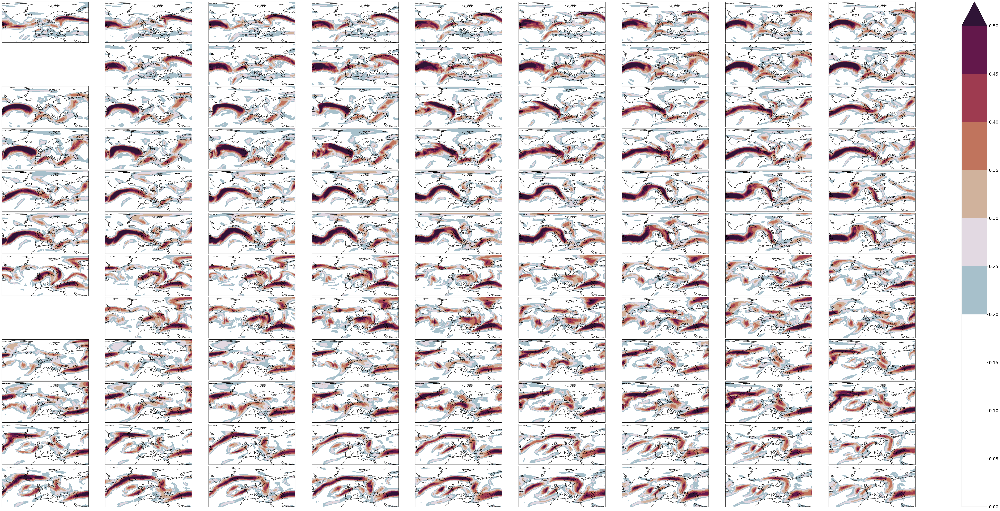

In [47]:
wide_conv_window.plot(da_s_cropped, conv_model, ncol=9, transparify=4, nlevels=11)


### Recurrent neural network

In [8]:
lstm_model = tf.keras.models.Sequential(
    [
        # Shape [batch, time, features] => [batch, time, lstm_units]
        tf.keras.layers.ConvLSTM2D(32, kernel_size=(3, 3), return_sequences=True, padding='same'),
        tf.keras.layers.ConvLSTM2D(32, kernel_size=(3, 3), return_sequences=True, padding='same'),
        # Shape => [batch, time, features]
        tf.keras.layers.Dense(units=1),
    ]
)


In [8]:
lstm_model = tf.keras.models.load_model('/storage/homefs/hb22g102/persistent-extremes-era5/results/models/convlstm/checkpoint10')

In [ ]:
# history = compile_and_fit(lstm_model, wide_window, filepath='/storage/homefs/hb22g102/persistent-extremes-era5/results/models/convlstm/checkpoint{epoch:02d}')

IPython.display.clear_output()
val_performance["LSTM"] = lstm_model.evaluate(wide_window.val)
performance["LSTM"] = lstm_model.evaluate(wide_window.test, verbose=0)


In [ ]:
lstm_model.save('/storage/homefs/hb22g102/persistent-extremes-era5/results/models/convlstm.keras')

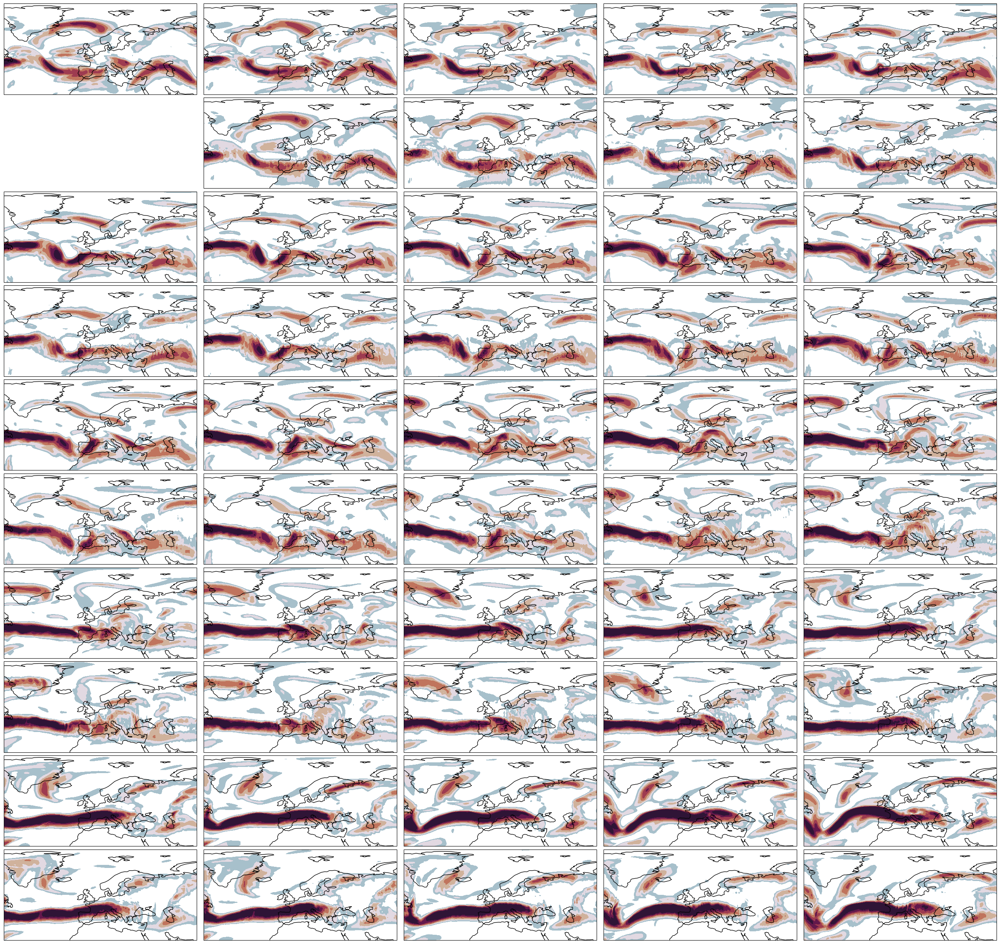

In [15]:
clu = wide_conv_window.plot(da_s_cropped, lstm_model, ncol=5, transparify=4, nlevels=11, max_n=1, draw_cbar=False)
clu.fig.set_size_inches(*(clu.fig.get_size_inches() * np.array([0.8, 1])))

### Performance

With this dataset typically each of the models does slightly better than the one before it:

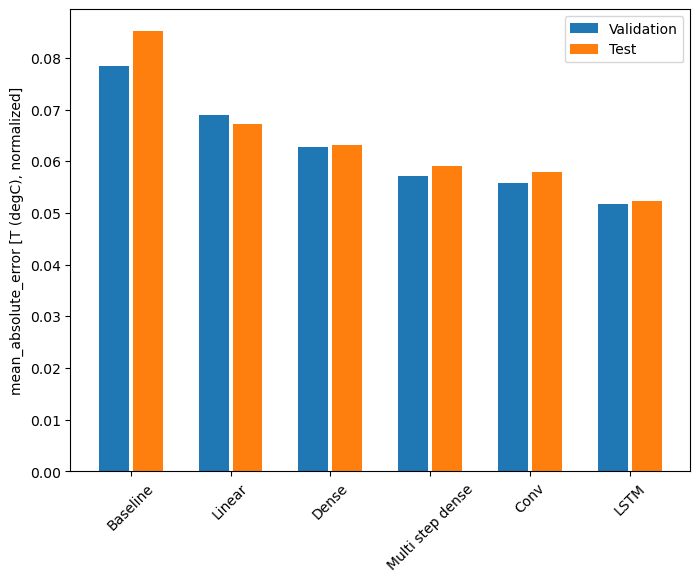

In [65]:
x = np.arange(len(performance))
width = 0.3
metric_name = "mean_absolute_error"
metric_index = lstm_model.metrics_names.index("mean_absolute_error")
val_mae = [v[metric_index] for v in val_performance.values()]
test_mae = [v[metric_index] for v in performance.values()]

plt.ylabel("mean_absolute_error [T (degC), normalized]")
plt.bar(x - 0.17, val_mae, width, label="Validation")
plt.bar(x + 0.17, test_mae, width, label="Test")
plt.xticks(ticks=x, labels=performance.keys(), rotation=45)
_ = plt.legend()


In [67]:
for name, value in performance.items():
    print(f"{name:20s}: {value[1]:0.4f}")


Baseline            : 0.0852
Linear              : 0.0672
Dense               : 0.0631
Multi step dense    : 0.0590
Conv                : 0.0580
LSTM                : 0.0524


### Multi-output models

The models so far all predicted a single output feature, `T (degC)`, for a single time step.

All of these models can be converted to predict multiple features just by changing the number of units in the output layer and adjusting the training windows to include all features in the `labels` (`example_labels`):

In [68]:
single_step_window = WindowGenerator(
    # `WindowGenerator` returns all features as labels if you
    # don't set the `label_columns` argument.
    input_width=1,
    label_width=1,
    shift=1,
)

wide_window = WindowGenerator(input_width=24, label_width=24, shift=1)

for example_inputs, example_labels in wide_window.train.take(1):
    print(f"Inputs shape (batch, time, features): {example_inputs.shape}")
    print(f"Labels shape (batch, time, features): {example_labels.shape}")


Inputs shape (batch, time, features): (32, 24, 19)
Labels shape (batch, time, features): (32, 24, 19)


Note above that the `features` axis of the labels now has the same depth as the inputs, instead of `1`.

#### Baseline

The same baseline model (`Baseline`) can be used here, but this time repeating all features instead of selecting a specific `label_index`:

In [69]:
baseline = Baseline()
baseline.compile(
    loss=tf.keras.losses.MeanSquaredError(),
    metrics=[tf.keras.metrics.MeanAbsoluteError()],
)


In [70]:
val_performance = {}
performance = {}
val_performance["Baseline"] = baseline.evaluate(wide_window.val)
performance["Baseline"] = baseline.evaluate(wide_window.test, verbose=0)


438/438 [==============================] - 1s 1ms/step - loss: 0.0886 - mean_absolute_error: 0.1589


#### Dense

In [71]:
dense = tf.keras.Sequential(
    [
        tf.keras.layers.Dense(units=64, activation="relu"),
        tf.keras.layers.Dense(units=64, activation="relu"),
        tf.keras.layers.Dense(units=num_features),
    ]
)


In [72]:
history = compile_and_fit(dense, single_step_window)

IPython.display.clear_output()
val_performance["Dense"] = dense.evaluate(single_step_window.val)
performance["Dense"] = dense.evaluate(single_step_window.test, verbose=0)


439/439 [==============================] - 1s 2ms/step - loss: 0.0708 - mean_absolute_error: 0.1333


#### RNN


In [73]:
%%time
wide_window = WindowGenerator(
    input_width=24, label_width=24, shift=1)

lstm_model = tf.keras.models.Sequential([
    # Shape [batch, time, features] => [batch, time, lstm_units]
    tf.keras.layers.LSTM(32, return_sequences=True),
    # Shape => [batch, time, features]
    tf.keras.layers.Dense(units=num_features)
])

history = compile_and_fit(lstm_model, wide_window)

IPython.display.clear_output()
val_performance['LSTM'] = lstm_model.evaluate( wide_window.val)
performance['LSTM'] = lstm_model.evaluate( wide_window.test, verbose=0)

print()

438/438 [==============================] - 1s 2ms/step - loss: 0.0613 - mean_absolute_error: 0.1198

CPU times: user 3min 54s, sys: 23.7 s, total: 4min 17s
Wall time: 1min 48s


<a id="residual"></a>

#### Advanced: Residual connections

The `Baseline` model from earlier took advantage of the fact that the sequence doesn't change drastically from time step to time step. Every model trained in this tutorial so far was randomly initialized, and then had to learn that the output is a a small change from the previous time step.

While you can get around this issue with careful initialization, it's  simpler to build this into the model structure.

It's common in time series analysis to build models that instead of predicting the next value, predict how the value will change in the next time step. Similarly, <a href="https://arxiv.org/abs/1512.03385" class="external">residual networks</a>—or ResNets—in deep learning refer to architectures where each layer adds to the model's accumulating result.

That is how you take advantage of the knowledge that the change should be small.

![A model with a residual connection](images/residual.png)

Essentially, this initializes the model to match the `Baseline`. For this task it helps models converge faster, with slightly better performance.

This approach can be used in conjunction with any model discussed in this tutorial. 

Here, it is being applied to the LSTM model, note the use of the `tf.initializers.zeros` to ensure that the initial predicted changes are small, and don't overpower the residual connection. There are no symmetry-breaking concerns for the gradients here, since the `zeros` are only used on the last layer.

In [74]:
class ResidualWrapper(tf.keras.Model):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def call(self, inputs, *args, **kwargs):
        delta = self.model(inputs, *args, **kwargs)

        # The prediction for each time step is the input
        # from the previous time step plus the delta
        # calculated by the model.
        return inputs + delta


In [75]:
%%time
residual_lstm = ResidualWrapper(
    tf.keras.Sequential([
    tf.keras.layers.LSTM(32, return_sequences=True),
    tf.keras.layers.Dense(
        num_features,
        # The predicted deltas should start small.
        # Therefore, initialize the output layer with zeros.
        kernel_initializer=tf.initializers.zeros())
]))

history = compile_and_fit(residual_lstm, wide_window)

IPython.display.clear_output()
val_performance['Residual LSTM'] = residual_lstm.evaluate(wide_window.val)
performance['Residual LSTM'] = residual_lstm.evaluate(wide_window.test, verbose=0)
print()

438/438 [==============================] - 1s 2ms/step - loss: 0.0623 - mean_absolute_error: 0.1184

CPU times: user 1min 40s, sys: 12.1 s, total: 1min 52s
Wall time: 42.5 s


#### Performance

Here is the overall performance for these multi-output models.

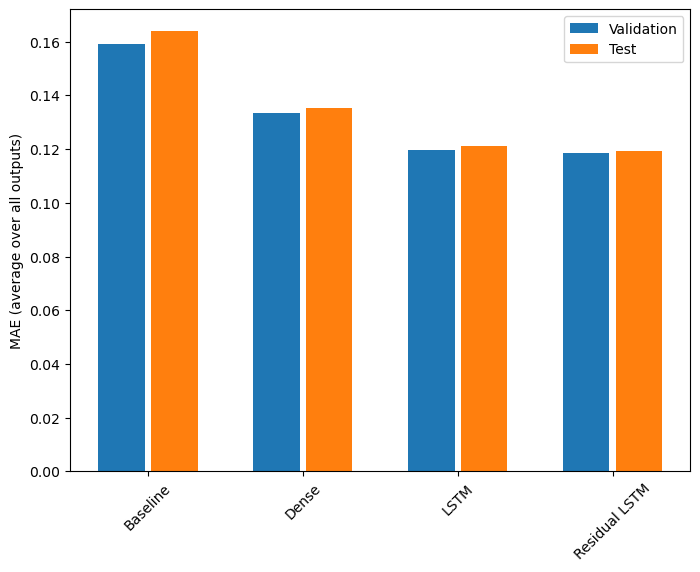

In [76]:
x = np.arange(len(performance))
width = 0.3

metric_name = "mean_absolute_error"
metric_index = lstm_model.metrics_names.index("mean_absolute_error")
val_mae = [v[metric_index] for v in val_performance.values()]
test_mae = [v[metric_index] for v in performance.values()]

plt.bar(x - 0.17, val_mae, width, label="Validation")
plt.bar(x + 0.17, test_mae, width, label="Test")
plt.xticks(ticks=x, labels=performance.keys(), rotation=45)
plt.ylabel("MAE (average over all outputs)")
_ = plt.legend()


In [77]:
for name, value in performance.items():
    print(f"{name:15s}: {value[1]:0.4f}")


Baseline       : 0.1638
Dense          : 0.1351
LSTM           : 0.1210
Residual LSTM  : 0.1192


The above performances are averaged across all model outputs.

## Multi-step models

Both the single-output and multiple-output models in the previous sections made **single time step predictions**, one hour into the future.

This section looks at how to expand these models to make **multiple time step predictions**.

In a multi-step prediction, the model needs to learn to predict a range of future values. Thus, unlike a single step model, where only a single future point is predicted, a multi-step model predicts a sequence of the future values.

There are two rough approaches to this:

1. Single shot predictions where the entire time series is predicted at once.
2. Autoregressive predictions where the model only makes single step predictions and its output is fed back as its input.

In this section all the models will predict **all the features across all output time steps**.


For the multi-step model, the training data again consists of hourly samples. However, here, the models will learn to predict 24 hours into the future, given 24 hours of the past.

Here is a `Window` object that generates these slices from the dataset:

Total window size: 48
Input indices: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23]
Label indices: [24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47]
Label column name(s): None

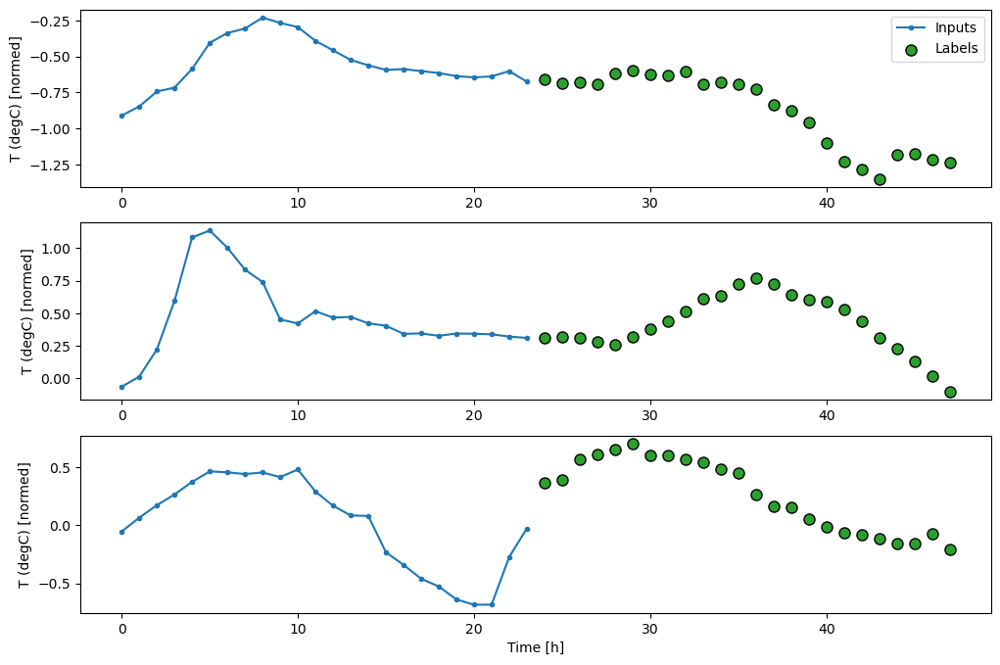

In [78]:
OUT_STEPS = 24
multi_window = WindowGenerator(input_width=24, label_width=OUT_STEPS, shift=OUT_STEPS)

multi_window.plot()
multi_window


### Baselines

A simple baseline for this task is to repeat the last input time step for the required number of output time steps:

![Repeat the last input, for each output step](images/multistep_last.png)

437/437 [==============================] - 1s 1ms/step - loss: 0.6285 - mean_absolute_error: 0.5007


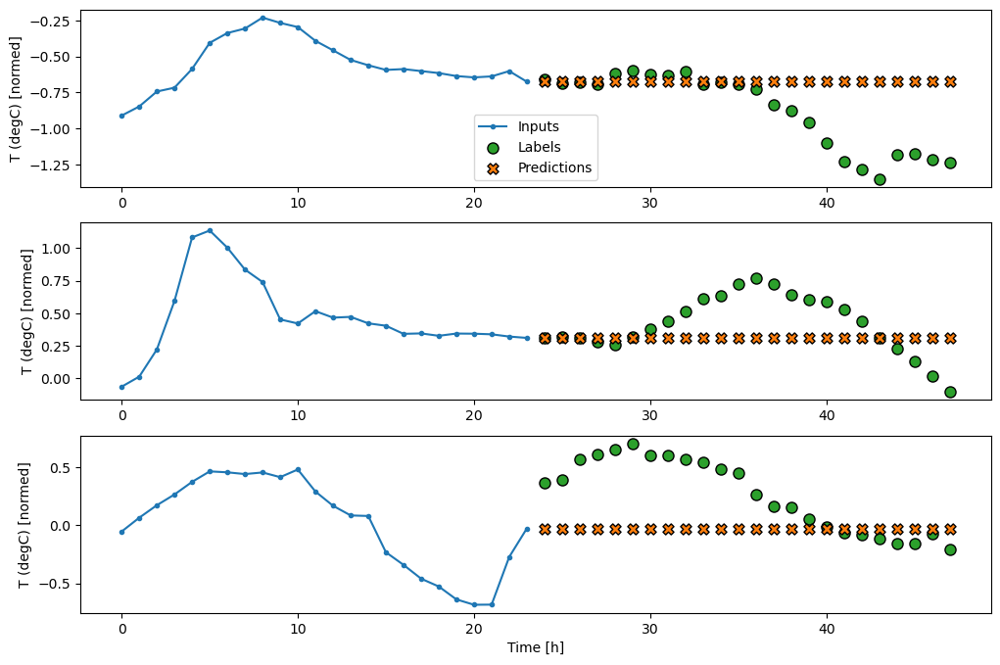

In [79]:
class MultiStepLastBaseline(tf.keras.Model):
    def call(self, inputs):
        return tf.tile(inputs[:, -1:, :], [1, OUT_STEPS, 1])


last_baseline = MultiStepLastBaseline()
last_baseline.compile(
    loss=tf.keras.losses.MeanSquaredError(),
    metrics=[tf.keras.metrics.MeanAbsoluteError()],
)

multi_val_performance = {}
multi_performance = {}

multi_val_performance["Last"] = last_baseline.evaluate(multi_window.val)
multi_performance["Last"] = last_baseline.evaluate(multi_window.test, verbose=0)
multi_window.plot(last_baseline)


Since this task is to predict 24 hours into the future, given 24 hours of the past, another simple approach is to repeat the previous day, assuming tomorrow will be similar:

![Repeat the previous day](images/multistep_repeat.png)

437/437 [==============================] - 1s 1ms/step - loss: 0.4270 - mean_absolute_error: 0.3959


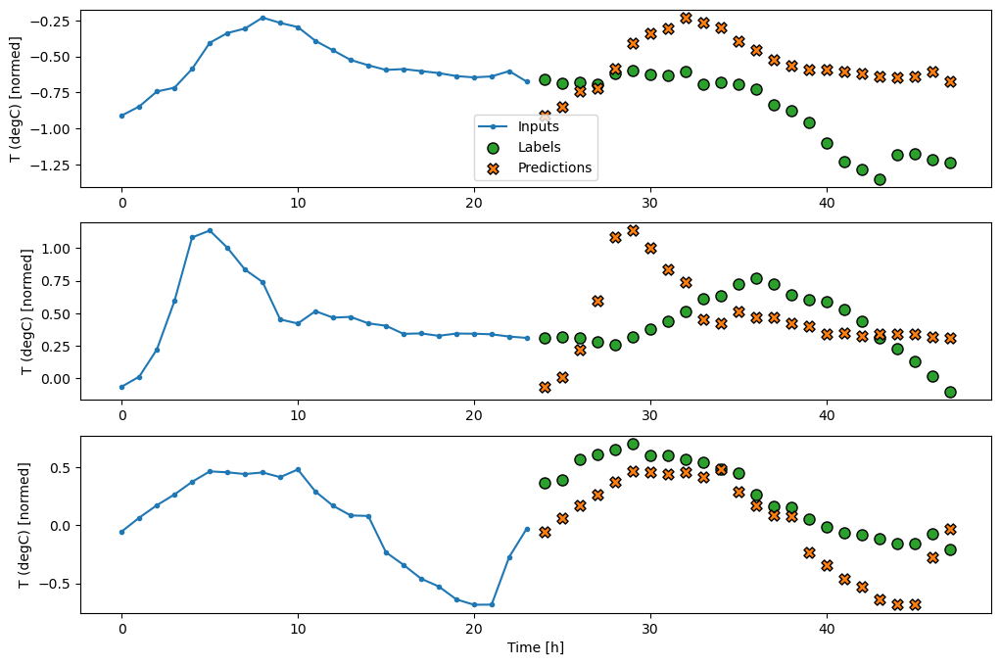

In [80]:
class RepeatBaseline(tf.keras.Model):
    def call(self, inputs):
        return inputs


repeat_baseline = RepeatBaseline()
repeat_baseline.compile(
    loss=tf.keras.losses.MeanSquaredError(),
    metrics=[tf.keras.metrics.MeanAbsoluteError()],
)

multi_val_performance["Repeat"] = repeat_baseline.evaluate(multi_window.val)
multi_performance["Repeat"] = repeat_baseline.evaluate(multi_window.test, verbose=0)
multi_window.plot(repeat_baseline)


### Single-shot models

One high-level approach to this problem is to use a "single-shot" model, where the model makes the entire sequence prediction in a single step.

This can be implemented efficiently as a `tf.keras.layers.Dense` with `OUT_STEPS*features` output units. The model just needs to reshape that output to the required `(OUTPUT_STEPS, features)`.

#### Linear

A simple linear model based on the last input time step does better than either baseline, but is underpowered. The model needs to predict `OUTPUT_STEPS` time steps, from a single input time step with a linear projection. It can only capture a low-dimensional slice of the behavior, likely based mainly on the time of day and time of year.

![Predict all timesteps from the last time-step](images/multistep_dense.png)

437/437 [==============================] - 1s 1ms/step - loss: 0.2554 - mean_absolute_error: 0.3048


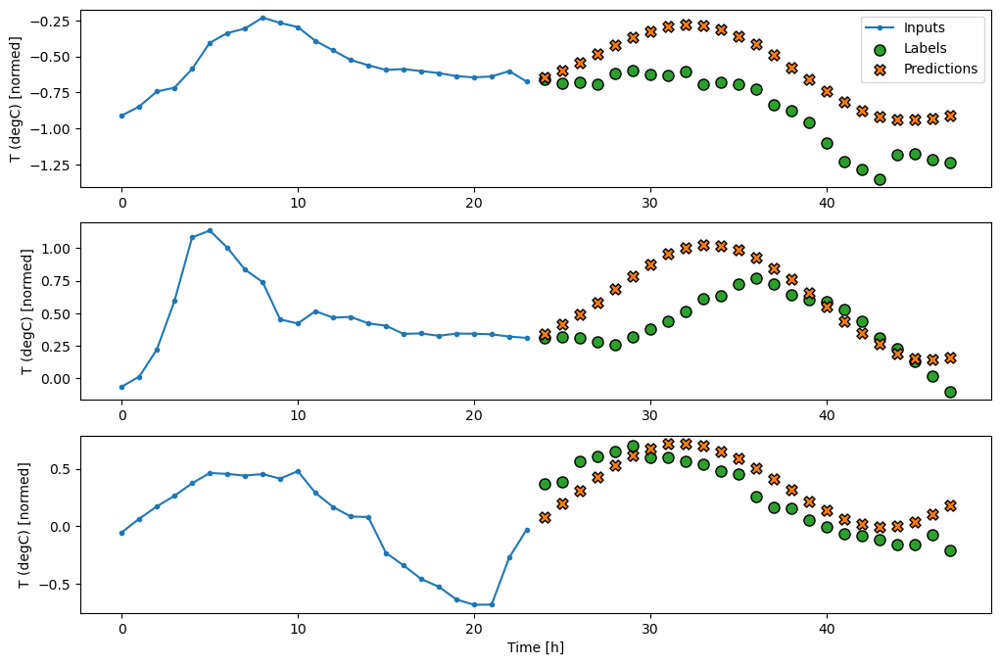

In [81]:
multi_linear_model = tf.keras.Sequential(
    [
        # Take the last time-step.
        # Shape [batch, time, features] => [batch, 1, features]
        tf.keras.layers.Lambda(lambda x: x[:, -1:, :]),
        # Shape => [batch, 1, out_steps*features]
        tf.keras.layers.Dense(
            OUT_STEPS * num_features, kernel_initializer=tf.initializers.zeros()
        ),
        # Shape => [batch, out_steps, features]
        tf.keras.layers.Reshape([OUT_STEPS, num_features]),
    ]
)

history = compile_and_fit(multi_linear_model, multi_window)

IPython.display.clear_output()
multi_val_performance["Linear"] = multi_linear_model.evaluate(multi_window.val)
multi_performance["Linear"] = multi_linear_model.evaluate(multi_window.test, verbose=0)
multi_window.plot(multi_linear_model)


#### Dense

Adding a `tf.keras.layers.Dense` between the input and output gives the linear model more power, but is still only based on a single input time step.

437/437 [==============================] - 1s 1ms/step - loss: 0.2190 - mean_absolute_error: 0.2826


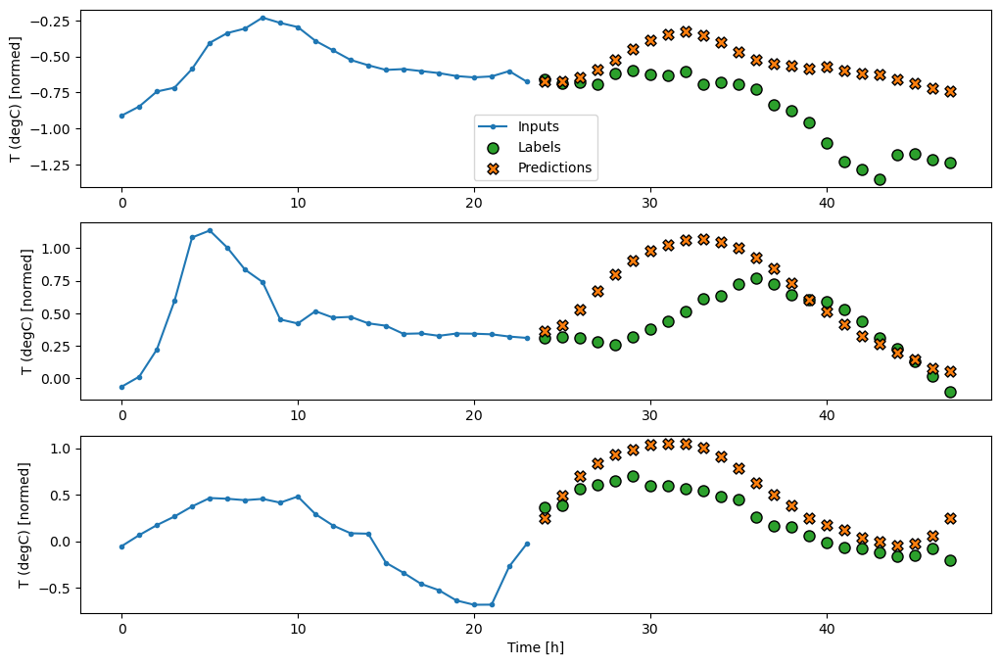

In [82]:
multi_dense_model = tf.keras.Sequential(
    [
        # Take the last time step.
        # Shape [batch, time, features] => [batch, 1, features]
        tf.keras.layers.Lambda(lambda x: x[:, -1:, :]),
        # Shape => [batch, 1, dense_units]
        tf.keras.layers.Dense(512, activation="relu"),
        # Shape => [batch, out_steps*features]
        tf.keras.layers.Dense(
            OUT_STEPS * num_features, kernel_initializer=tf.initializers.zeros()
        ),
        # Shape => [batch, out_steps, features]
        tf.keras.layers.Reshape([OUT_STEPS, num_features]),
    ]
)

history = compile_and_fit(multi_dense_model, multi_window)

IPython.display.clear_output()
multi_val_performance["Dense"] = multi_dense_model.evaluate(multi_window.val)
multi_performance["Dense"] = multi_dense_model.evaluate(multi_window.test, verbose=0)
multi_window.plot(multi_dense_model)


#### CNN

A convolutional model makes predictions based on a fixed-width history, which may lead to better performance than the dense model since it can see how things are changing over time:

![A convolutional model sees how things change over time](images/multistep_conv.png)

437/437 [==============================] - 1s 2ms/step - loss: 0.2156 - mean_absolute_error: 0.2834


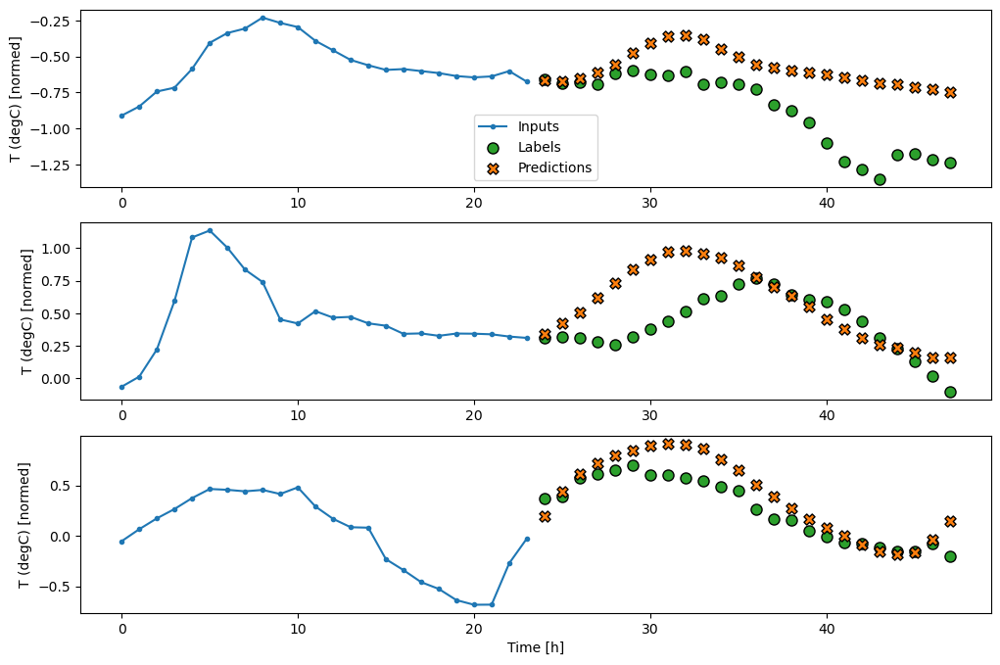

In [83]:
CONV_WIDTH = 3
multi_conv_model = tf.keras.Sequential(
    [
        # Shape [batch, time, features] => [batch, CONV_WIDTH, features]
        tf.keras.layers.Lambda(lambda x: x[:, -CONV_WIDTH:, :]),
        # Shape => [batch, 1, conv_units]
        tf.keras.layers.Conv1D(256, activation="relu", kernel_size=(CONV_WIDTH)),
        # Shape => [batch, 1,  out_steps*features]
        tf.keras.layers.Dense(
            OUT_STEPS * num_features, kernel_initializer=tf.initializers.zeros()
        ),
        # Shape => [batch, out_steps, features]
        tf.keras.layers.Reshape([OUT_STEPS, num_features]),
    ]
)

history = compile_and_fit(multi_conv_model, multi_window)

IPython.display.clear_output()

multi_val_performance["Conv"] = multi_conv_model.evaluate(multi_window.val)
multi_performance["Conv"] = multi_conv_model.evaluate(multi_window.test, verbose=0)
multi_window.plot(multi_conv_model)


#### RNN

A recurrent model can learn to use a long history of inputs, if it's relevant to the predictions the model is making. Here the model will accumulate internal state for 24 hours, before making a single prediction for the next 24 hours.

In this single-shot format, the LSTM only needs to produce an output at the last time step, so set `return_sequences=False` in `tf.keras.layers.LSTM`.

![The LSTM accumulates state over the input window, and makes a single prediction for the next 24 hours](images/multistep_lstm.png)


437/437 [==============================] - 1s 2ms/step - loss: 0.2127 - mean_absolute_error: 0.2834


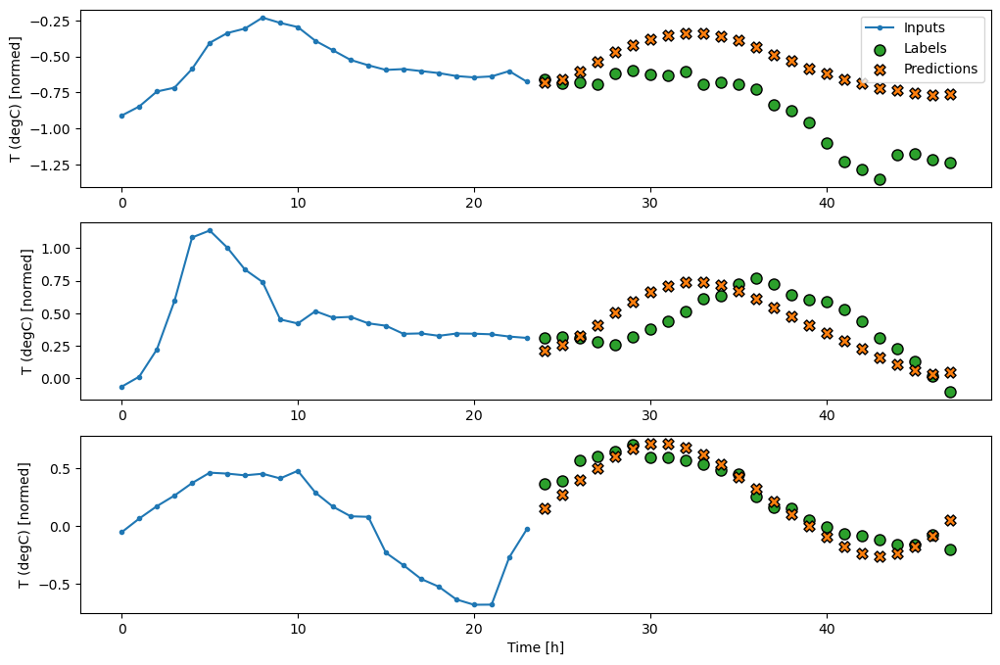

In [84]:
multi_lstm_model = tf.keras.Sequential(
    [
        # Shape [batch, time, features] => [batch, lstm_units].
        # Adding more `lstm_units` just overfits more quickly.
        tf.keras.layers.LSTM(32, return_sequences=False),
        # Shape => [batch, out_steps*features].
        tf.keras.layers.Dense(
            OUT_STEPS * num_features, kernel_initializer=tf.initializers.zeros()
        ),
        # Shape => [batch, out_steps, features].
        tf.keras.layers.Reshape([OUT_STEPS, num_features]),
    ]
)

history = compile_and_fit(multi_lstm_model, multi_window)

IPython.display.clear_output()

multi_val_performance["LSTM"] = multi_lstm_model.evaluate(multi_window.val)
multi_performance["LSTM"] = multi_lstm_model.evaluate(multi_window.test, verbose=0)
multi_window.plot(multi_lstm_model)


### Advanced: Autoregressive model

The above models all predict the entire output sequence in a single step.

In some cases it may be helpful for the model to decompose this prediction into individual time steps. Then, each model's output can be fed back into itself at each step and predictions can be made conditioned on the previous one, like in the classic <a href="https://arxiv.org/abs/1308.0850" class="external">Generating Sequences With Recurrent Neural Networks</a>.

One clear advantage to this style of model is that it can be set up to produce output with a varying length.

You could take any of the single-step multi-output models trained in the first half of this tutorial and run in an autoregressive feedback loop, but here you'll focus on building a model that's been explicitly trained to do that.

![Feedback a model's output to its input](images/multistep_autoregressive.png)

#### RNN

This tutorial only builds an autoregressive RNN model, but this pattern could be applied to any model that was designed to output a single time step.

The model will have the same basic form as the single-step LSTM models from earlier: a `tf.keras.layers.LSTM` layer followed by a `tf.keras.layers.Dense` layer that converts the `LSTM` layer's outputs to model predictions.

A `tf.keras.layers.LSTM` is a `tf.keras.layers.LSTMCell` wrapped in the higher level `tf.keras.layers.RNN` that manages the state and sequence results for you (Check out the [Recurrent Neural Networks (RNN) with Keras](https://www.tensorflow.org/guide/keras/rnn) guide for details).

In this case, the model has to manually manage the inputs for each step, so it uses `tf.keras.layers.LSTMCell` directly for the lower level, single time step interface.

In [85]:
class FeedBack(tf.keras.Model):
    def __init__(self, units, out_steps):
        super().__init__()
        self.out_steps = out_steps
        self.units = units
        self.lstm_cell = tf.keras.layers.LSTMCell(units)
        # Also wrap the LSTMCell in an RNN to simplify the `warmup` method.
        self.lstm_rnn = tf.keras.layers.RNN(self.lstm_cell, return_state=True)
        self.dense = tf.keras.layers.Dense(num_features)


In [86]:
feedback_model = FeedBack(units=32, out_steps=OUT_STEPS)


The first method this model needs is a `warmup` method to initialize its internal state based on the inputs. Once trained, this state will capture the relevant parts of the input history. This is equivalent to the single-step `LSTM` model from earlier:

In [87]:
def warmup(self, inputs):
    # inputs.shape => (batch, time, features)
    # x.shape => (batch, lstm_units)
    x, *state = self.lstm_rnn(inputs)

    # predictions.shape => (batch, features)
    prediction = self.dense(x)
    return prediction, state


FeedBack.warmup = warmup


This method returns a single time-step prediction and the internal state of the `LSTM`:

In [88]:
prediction, state = feedback_model.warmup(multi_window.example[0])
prediction.shape


TensorShape([32, 19])

With the `RNN`'s state, and an initial prediction you can now continue iterating the model feeding the predictions at each step back as the input.

The simplest approach for collecting the output predictions is to use a Python list and a `tf.stack` after the loop.

Note: Stacking a Python list like this only works with eager-execution, using `Model.compile(..., run_eagerly=True)` for training, or with a fixed length output. For a dynamic output length, you would need to use a `tf.TensorArray` instead of a Python list, and `tf.range` instead of the Python `range`.

In [89]:
def call(self, inputs, training=None):
    # Use a TensorArray to capture dynamically unrolled outputs.
    predictions = []
    # Initialize the LSTM state.
    prediction, state = self.warmup(inputs)

    # Insert the first prediction.
    predictions.append(prediction)

    # Run the rest of the prediction steps.
    for n in range(1, self.out_steps):
        # Use the last prediction as input.
        x = prediction
        # Execute one lstm step.
        x, state = self.lstm_cell(x, states=state, training=training)
        # Convert the lstm output to a prediction.
        prediction = self.dense(x)
        # Add the prediction to the output.
        predictions.append(prediction)

    # predictions.shape => (time, batch, features)
    predictions = tf.stack(predictions)
    # predictions.shape => (batch, time, features)
    predictions = tf.transpose(predictions, [1, 0, 2])
    return predictions


FeedBack.call = call


Test run this model on the example inputs:

In [90]:
print(
    "Output shape (batch, time, features): ",
    feedback_model(multi_window.example[0]).shape,
)


Output shape (batch, time, features):  (32, 24, 19)


Now, train the model:

437/437 [==============================] - 3s 8ms/step - loss: 0.2239 - mean_absolute_error: 0.2976


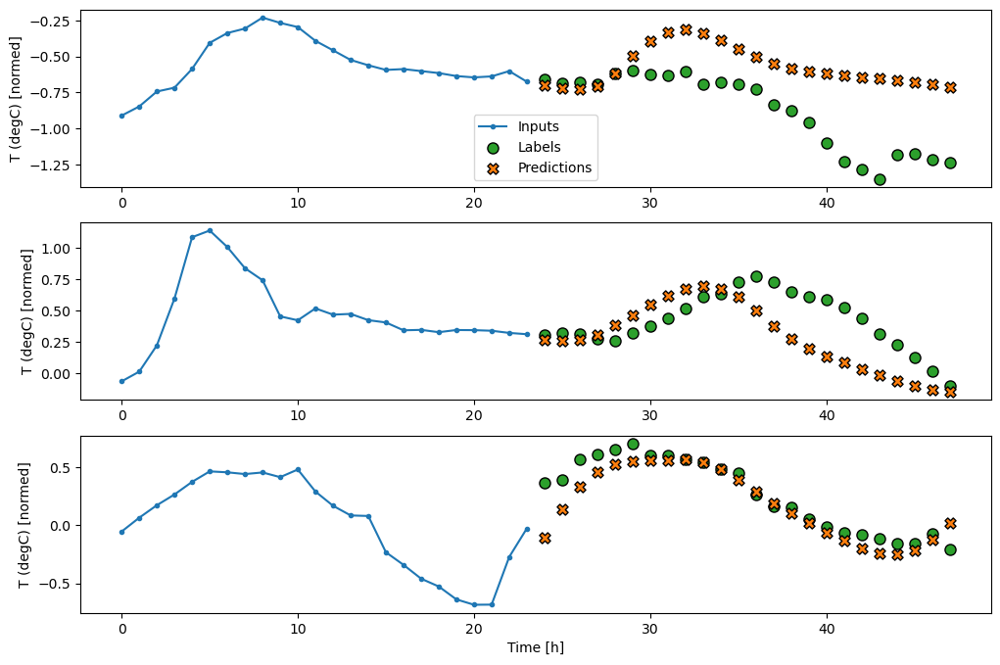

In [91]:
history = compile_and_fit(feedback_model, multi_window)

IPython.display.clear_output()

multi_val_performance["AR LSTM"] = feedback_model.evaluate(multi_window.val)
multi_performance["AR LSTM"] = feedback_model.evaluate(multi_window.test, verbose=0)
multi_window.plot(feedback_model)


### Performance

There are clearly diminishing returns as a function of model complexity on this problem:

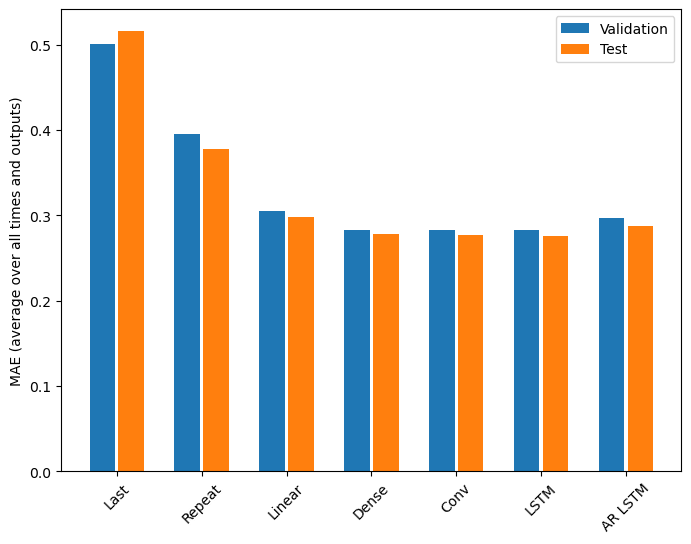

In [92]:
x = np.arange(len(multi_performance))
width = 0.3

metric_name = "mean_absolute_error"
metric_index = lstm_model.metrics_names.index("mean_absolute_error")
val_mae = [v[metric_index] for v in multi_val_performance.values()]
test_mae = [v[metric_index] for v in multi_performance.values()]

plt.bar(x - 0.17, val_mae, width, label="Validation")
plt.bar(x + 0.17, test_mae, width, label="Test")
plt.xticks(ticks=x, labels=multi_performance.keys(), rotation=45)
plt.ylabel(f"MAE (average over all times and outputs)")
_ = plt.legend()


The metrics for the multi-output models in the first half of this tutorial show the performance averaged across all output features. These performances are similar but also averaged across output time steps. 

In [93]:
for name, value in multi_performance.items():
    print(f"{name:8s}: {value[1]:0.4f}")


Last    : 0.5157
Repeat  : 0.3774
Linear  : 0.2979
Dense   : 0.2787
Conv    : 0.2769
LSTM    : 0.2762
AR LSTM : 0.2873


The gains achieved going from a dense model to convolutional and recurrent models are only a few percent (if any), and the autoregressive model performed clearly worse. So these more complex approaches may not be worth while on **this** problem, but there was no way to know without trying, and these models could be helpful for **your** problem.

## Next steps

This tutorial was a quick introduction to time series forecasting using TensorFlow.

To learn more, refer to:

- Chapter 15 of <a href="https://www.oreilly.com/library/view/hands-on-machine-learning/9781492032632/" class="external">Hands-on Machine Learning with Scikit-Learn, Keras, and TensorFlow</a>, 2nd Edition.
- Chapter 6 of <a href="https://www.manning.com/books/deep-learning-with-python" class="external">Deep Learning with Python</a>.
- Lesson 8 of <a href="https://www.udacity.com/course/intro-to-tensorflow-for-deep-learning--ud187" class="external">Udacity's intro to TensorFlow for deep learning</a>, including the <a href="https://github.com/tensorflow/examples/tree/master/courses/udacity_intro_to_tensorflow_for_deep_learning" class="external">exercise notebooks</a>.

Also, remember that you can implement any <a href="https://otexts.com/fpp2/index.html" class="external">classical time series model</a> in TensorFlow—this tutorial just focuses on TensorFlow's built-in functionality.
